# Evaluation of distribution of models on 60km -> 2.2km-4x over Birmingham

In [ ]:
%reload_ext autoreload

%autoreload 2

%reload_ext dotenv
%dotenv

In [ ]:
from mlde_analysis.default_params import *

In [ ]:
# Parameters
desc = "Comparison of diffusion model for CPMGEM-pr paper\nTest split\n12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set\nCompare techniques: diffusion, u-net, bilinear\n"
eval_vars = ["pr"]
derived_variables_config = {}
dataset_configs = {
    "CPM": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
    "GCM": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
}
exclude_days = 15
split = "test"
ensemble_members = [
    "01",
    "04",
    "05",
    "06",
    "07",
    "08",
    "09",
    "10",
    "11",
    "12",
    "13",
    "15",
]
samples_per_run = 6
sample_configs = {
    "CPM": [
        {
            "label": "CPMGEM_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "color": "tab:blue",
            "order": 11,
        },
        {
            "label": "U-Net_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/deterministic/ukcp_local_pr_12em_plain_unet/bham_pSTV-ema-gradcl-256-batch",
                    "checkpoint": "epoch_100",
                    "input_xfm": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-stan",
                    "dataset": "bham64_ccpm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:orange",
            "order": 2,
        },
        {
            "label": "BCSD_cCPM",
            "sample_specs": [
                {
                    "fq_model_id": "bcsd-v1/ukcp_local_pr_12em-ws3",
                    "checkpoint": "epoch-0",
                    "input_xfm": "bham64_ccpm-4x_12em_linpr_pr-bcsd",
                    "dataset": "bham64_ccpm-4x_12em_linpr_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": True,
            "color": "tab:red",
            "order": 1,
            "UQ": True,
            "CCS": True,
        },
    ],
    "GCM": [
        {
            "label": "CPMGEM_GCM",
            "sample_specs": [
                {
                    "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV",
                    "checkpoint": "epoch_20",
                    "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                    "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                    "variables": ["pr"],
                }
            ],
            "deterministic": False,
            "CCS": True,
            "UQ": False,
            "color": "tab:green",
            "order": 20,
        }
    ],
}
sample_configs_at_60km = [
    {
        "label": "CPMGEM_GCM@60km",
        "sample_specs": [
            {
                "fq_model_id": "score-sde/subvpsde/ukcp_local_pr_12em_cncsnpp_continuous/bham-4x_12em_pSTV/postprocess/gcm-grid",
                "checkpoint": "epoch_20",
                "input_xfm": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr-pixelmmsstan",
                "dataset": "bham64_gcm-4x_12em_psl-sphum4th-temp4th-vort4th_pr",
                "variables": ["pr"],
            }
        ],
        "deterministic": False,
    }
]
dataset_configs_at_60km = {
    "CPM": "bham64_ccpm-60km_12em_pr_pr",
    "GCM": "bham64_gcm-60km_12em_rawpr_pr",
}
example_percentiles = {
    "CPM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
    "GCM": {
        "DJF Wet": {"percentile": 0.8, "variable": "pr", "season": "DJF"},
        "DJF Wettest": {"percentile": 1, "variable": "pr", "season": "DJF"},
        "JJA Wet": {"percentile": 0.8, "variable": "pr", "season": "JJA"},
        "JJA Wettest": {"percentile": 1, "variable": "pr", "season": "JJA"},
    },
}
example_overrides = {"CPM": {"JJA Wet": ["01", "1993-08-01 12:00:00"]}, "GCM": {}}
examples_sample_idxs = [2, 5]
niterations = 30
bootstrap_configs = {"niterations": {"spread-error": 50}}


In [ ]:
import functools
import math
import string

import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from mlde_analysis import plot_map, SUBREGIONS, BOX_LOCATIONS
from mlde_analysis.display import pretty_table, VAR_RANGES
from mlde_analysis.distribution import mean_bias, std_bias, stat_bias, plot_freq_density, plot_distribution_figure, compute_metrics, DIST_THRESHOLDS, plot_freq_density_figure
from mlde_analysis.wet_dry import threshold_exceeded_prop_stats, threshold_exceeded_prop, threshold_exceeded_prop_error, threshold_exceeded_prop_change, plot_threshold_exceedence_errors, THRESHOLDS, wd_mean, wd_mean_bias
from mlde_utils import cp_model_rotated_pole
from mlde_analysis import qq_plot, reasonable_quantiles

In [ ]:
matplotlib.rcParams['figure.dpi'] = 300

In [ ]:
IPython.display.Markdown(desc)

Comparison of diffusion model for CPMGEM-pr paper
Test split
12em dataset and models, 60km inputs -> 8.8km outputs, pSTV input variable set
Compare techniques: diffusion, u-net, bilinear


In [ ]:
%reload_ext mlde_analysis.magics 
EVAL_DS, MODELS, CPM_DAS, PRED_DAS, VAR_DAS, MODELLABEL2SPEC = %load_eval_data
EVAL_DS

{'CPM': <xarray.Dataset> Size: 23GB
 Dimensions:                     (ensemble_member: 12, time: 2160,
                                  grid_latitude: 64, grid_longitude: 64,
                                  model: 3, sample_id: 6, bnds: 2)
 Coordinates:
   * ensemble_member             (ensemble_member) <U2 96B '01' '04' ... '15'
   * time                        (time) object 17kB 1981-03-16 12:00:00 ... 20...
   * grid_latitude               (grid_latitude) float32 256B -2.49 ... 2.55
   * grid_longitude              (grid_longitude) float32 256B 357.9 ... 363.0
   * model                       (model) object 24B 'CPMGEM_cCPM' ... 'BCSD_cCPM'
     season                      (time) int64 17kB 1 1 1 1 1 1 1 ... 2 2 2 2 2 2
     time_period                 (time) <U8 69kB 'historic' ... 'future'
     dec_adjusted_year           (time) int64 17kB 1981 1981 1981 ... 2076 2076
     stratum                     (time) <U12 104kB 'historic MAM' ... 'future ...
     tp_season_year          

## Figure: distribution

* Frequency Density Histogram of rainfall intensities
* Maps of Mean bias ($\frac{\mu_{sample}-\mu_{CPM}}{\mu_{CPM}}$) over all samples, time and ensemble members
* Std Dev Bias $\frac{\sigma_{sample}}{\sigma_{CPM}}$ over all samples, time and ensemble members

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

### pr

,NaN Count,RMS Mean Bias (mm/day),RMS Std Dev Bias (mm/day),quantile,RMS Q999 Bias (mm/day),Relative RMS Mean Bias (%),Relative RMS Std Dev Bias (%),Relative RMS Q999 Bias (%),J-S distance,Emu > 0.1,Emu > 0.1 - CPM > 0.1,Emu > 25,Emu > 25 - CPM > 25,Emu > 75,Emu > 75 - CPM > 75,Emu > 125,Emu > 125 - CPM > 125
model,,,,,,,,,,,,,,,,,
BCSD_cCPM,0,0.03678,0.5777,0.999,6.275,1.567,11.37,14.02,0.01709,0.6634,0.1295,0.006777,-0.002902,5.715e-05,-5.137e-05,3.391e-06,-1.507e-06
CPMGEM_GCM,0,0.08755,0.2052,0.999,2.754,2.774,4.025,6.283,0.00518,0.5508,0.0169,0.009009,-0.0006707,8.282e-05,-2.571e-05,3.571e-06,-1.327e-06
CPMGEM_cCPM,0,0.08811,0.1723,0.999,2.431,3.175,3.261,5.499,0.002286,0.5294,-0.004521,0.009444,-0.0002358,0.000101,-7.549e-06,4.884e-06,-1.413e-08
U-Net_cCPM,0,0.2077,0.6265,0.999,7.504,9.301,13.22,17.89,0.01705,0.5681,0.03416,0.00676,-0.00292,4.424e-05,-6.428e-05,1.177e-06,-3.721e-06


9.419005594135802e-09
5e-10


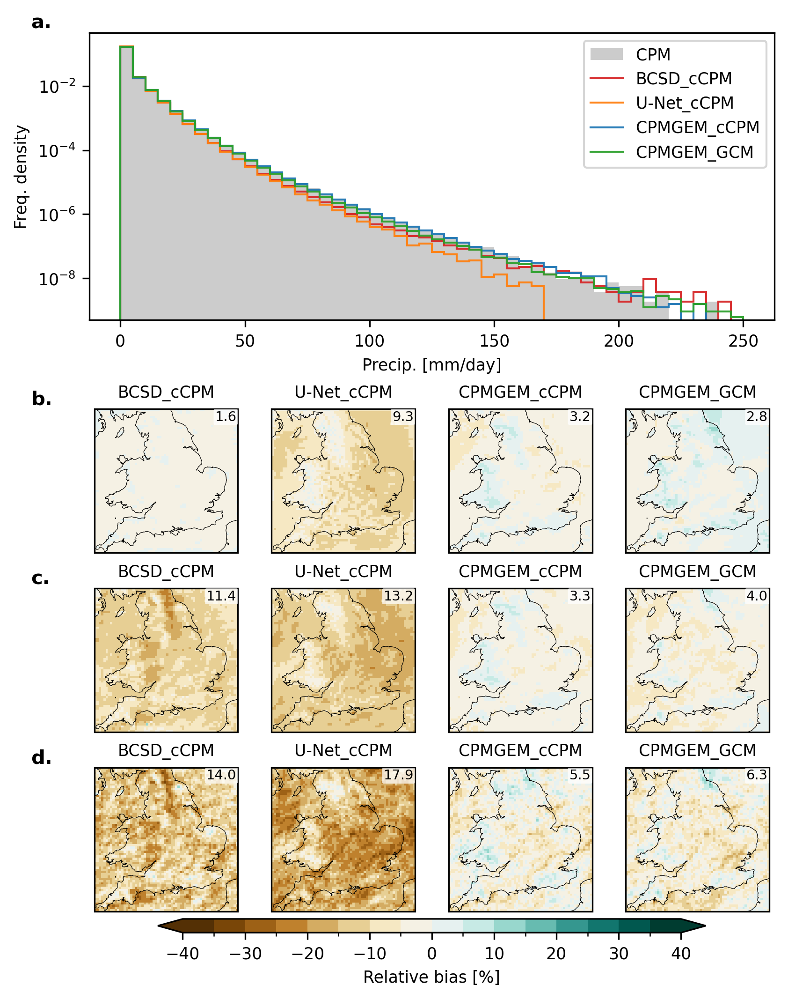

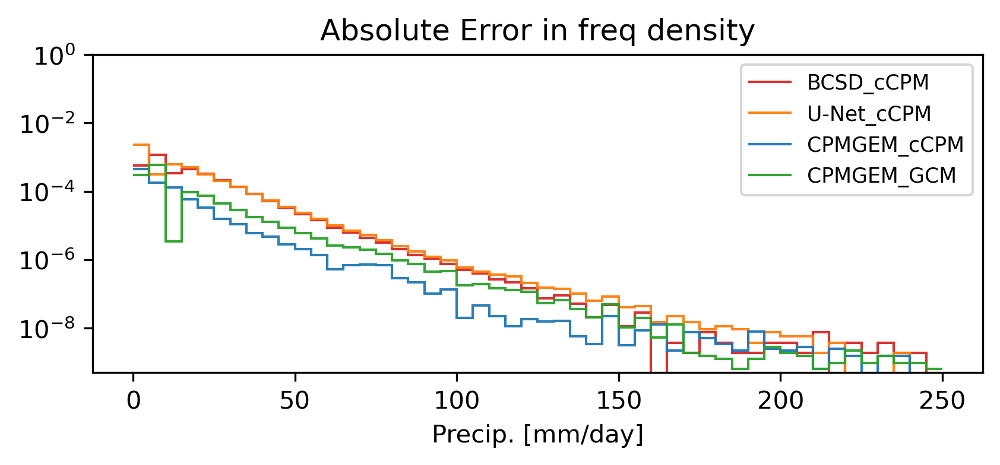

9.419005594135802e-09
5e-10


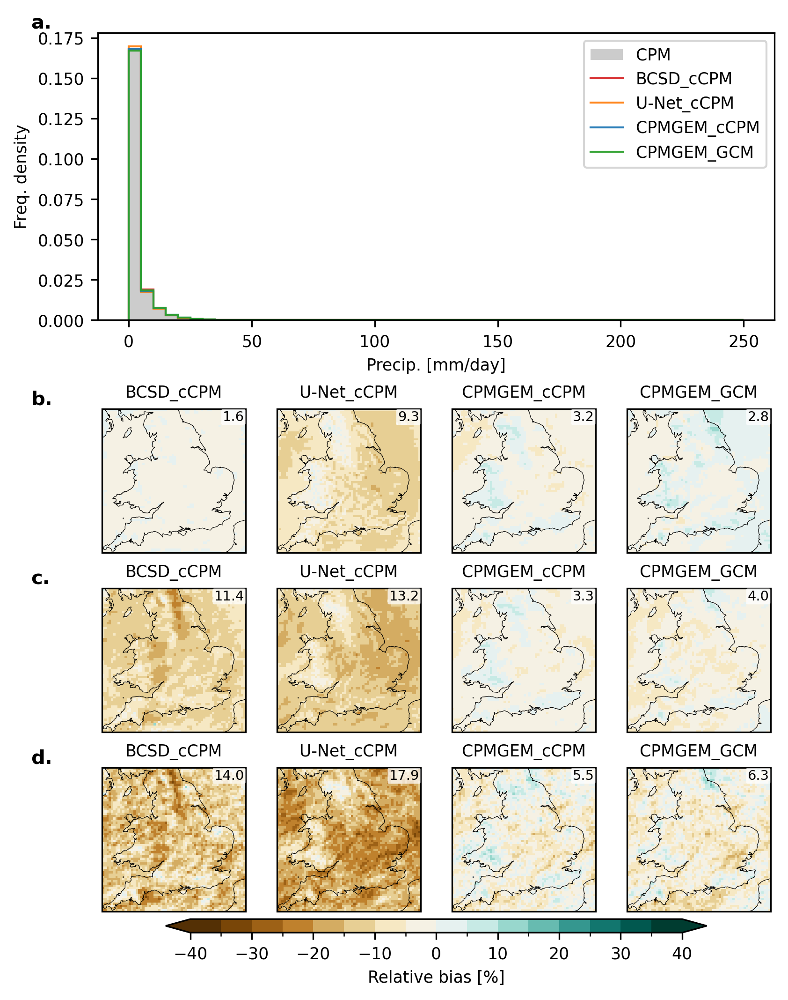

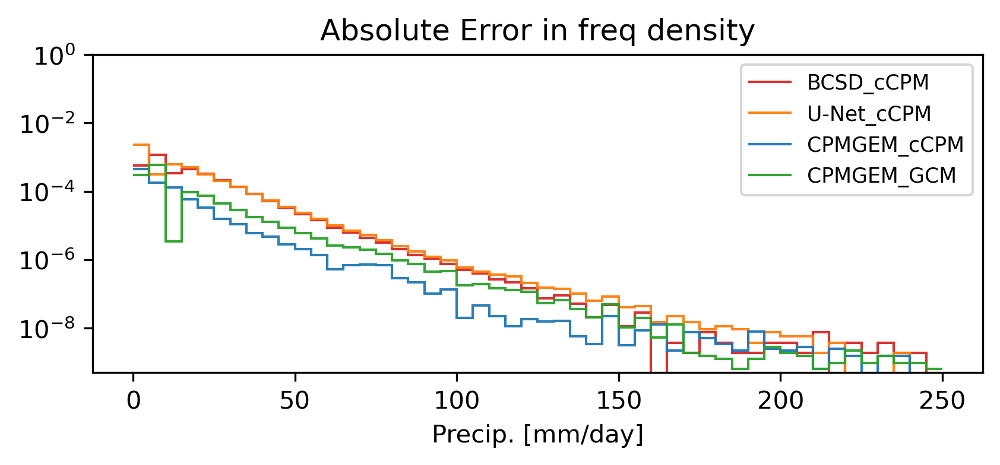

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)
    
    hist_das = PRED_DAS[var]
    cpm_da = CPM_DAS[var]
    
    metrics_ds = compute_metrics(hist_das, cpm_da, thresholds=DIST_THRESHOLDS[var])

    pretty_table(metrics_ds, round=4)
    
    normalize=(var == "pr")
    mean_biases = PRED_DAS[var].groupby("model").map(mean_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))

    std_biases = PRED_DAS[var].groupby("model").map(std_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))
    f_q999_bias = functools.partial(stat_bias, stat_func=functools.partial(xr.DataArray.quantile, q=0.999))
    q999_biases = PRED_DAS[var].groupby("model").map(f_q999_bias, cpm_da=VAR_DAS[var][f"target_{var}"], normalize=(var=="pr"))
    
    bias_kwargs = {"style": f"{var}Bias"}
    for fd_kwargs in [{"yscale": "log"}, {"yscale": "linear"}]:
        fig = plt.figure(layout="constrained", figsize=(5.5, 7))
        error_fig = plt.figure(layout="constrained", figsize=(5.5, 2.5))
        error_axd = error_fig.subplot_mosaic([["Error"]])
        error_ax = error_axd["Error"]
        axd = plot_distribution_figure(
            fig,
            hist_das,
            cpm_da,
            mean_biases,
            std_biases,
            q999_biases,
            MODELLABEL2SPEC,
            error_ax=error_ax, hrange=VAR_RANGES[var], fd_kwargs=fd_kwargs, bias_kwargs=bias_kwargs
        )
        if var == "relhum150cm":
            axd["Density"].axvline(x=100, color='k', linestyle='--', linewidth=1)
        
        plt.show()

## QQ plots

### pr

-8


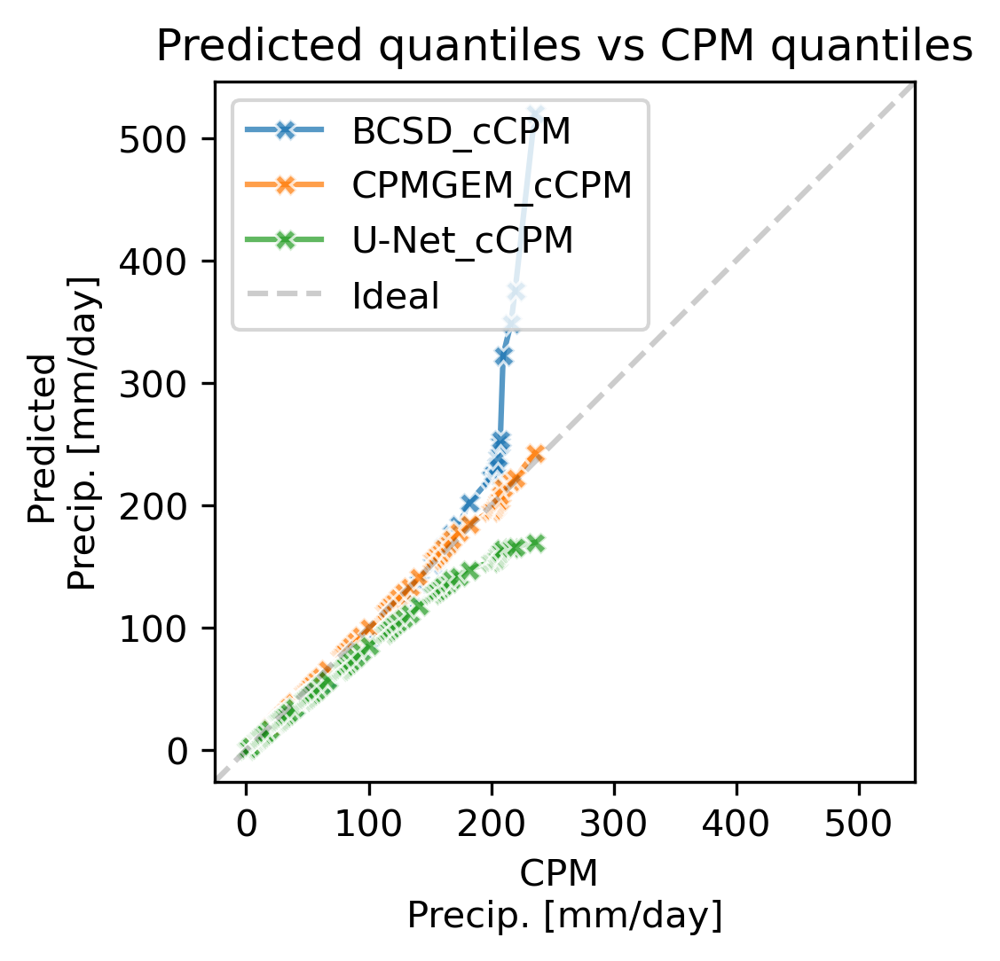

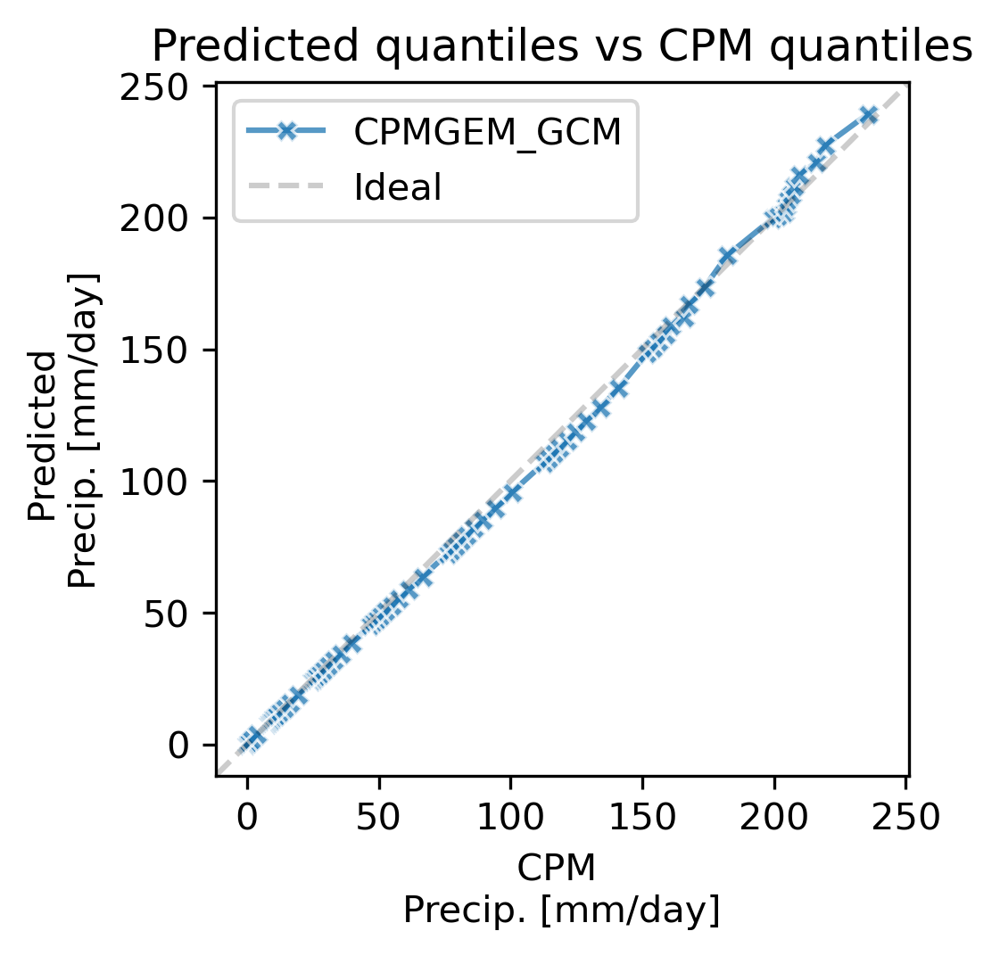

In [ ]:
quantile_dims=["ensemble_member", "time", "grid_latitude", "grid_longitude"]

for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    quantiles = reasonable_quantiles(CPM_DAS[var])
    cpm_quantiles = CPM_DAS[var].quantile(quantiles, dim=quantile_dims).rename("target_q")

    for source, ds in EVAL_DS.items():
        pred_da = ds[f"pred_{var}"]
        pred_quantiles = pred_da.quantile(quantiles, dim=quantile_dims).rename("pred_q")

        layout="constrained"

        fig, ax = plt.subplots(figsize=(3.5, 3.5), layout="constrained")

        xlabel = f"CPM \n{xr.plot.utils.label_from_attrs(da=CPM_DAS[var])}"
        ylabel = f"Predicted \n{xr.plot.utils.label_from_attrs(da=pred_da)}"

        qq_plot(ax, cpm_quantiles, pred_quantiles, title=f"Predicted quantiles vs CPM quantiles", xlabel=xlabel, ylabel=ylabel)

    plt.show()

## Figure: subdomain

### pr

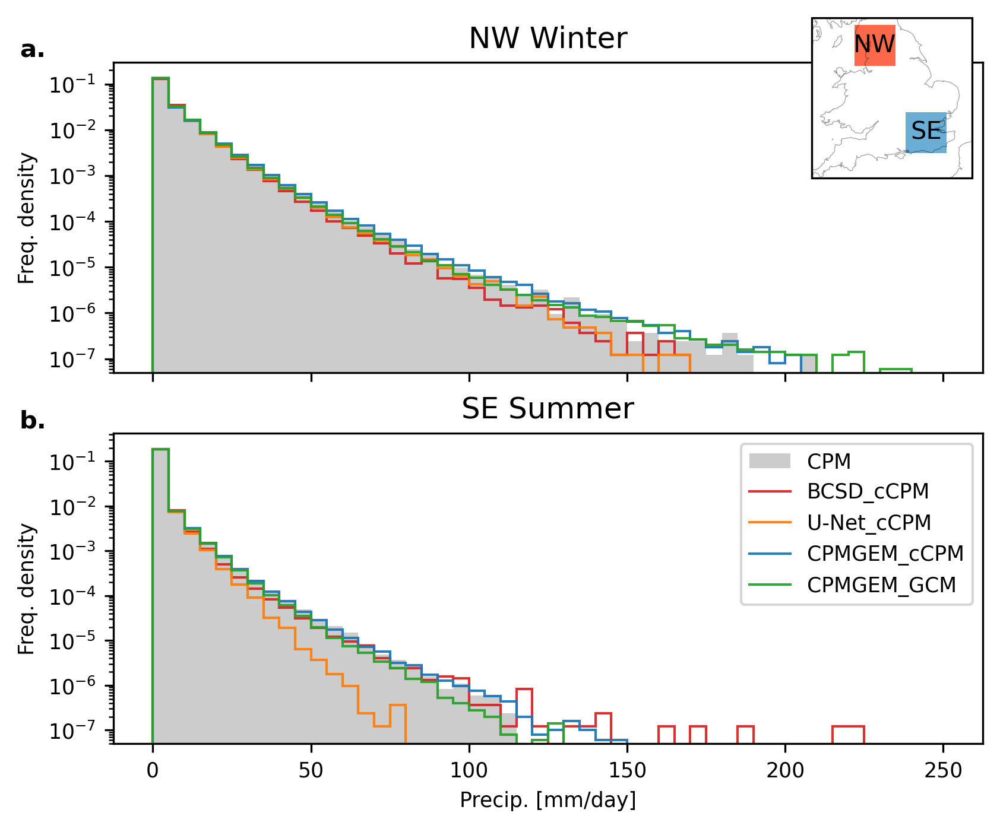

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fd_fig = plt.figure(figsize=(5.5, 4.5), layout="constrained")

    human_names = {
        "DJF": "Winter",
        "JJA": "Summer",
    }

    axd = fd_fig.subplot_mosaic([["NW"], ["SE"]], sharex=True)
    
    for i, (srname, season) in enumerate([("NW", "DJF"), ("SE", "JJA")]):

        season_mask = CPM_DAS[var]["time"]["time.season"] == season

        srseason_cpm_da = CPM_DAS[var].isel(**SUBREGIONS[srname]).sel(time=season_mask)

        srseason_hist_data = [
            dict(data=EVAL_DS[source][f"pred_{var}"].sel(model=model).isel(**SUBREGIONS[srname]).sel(time=season_mask), label=model, color=spec["color"]) for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
        ]

        ax = axd[srname]
        if var == "pr":
            kwargs = {
                "yscale": "log",
            }
        else:
            kwargs = {
                "yscale": "linear",
            }
        plot_freq_density(srseason_hist_data, ax=ax, target_da=srseason_cpm_da, linewidth=1, hrange=VAR_RANGES[var], **kwargs)
        ax.set_title(f"{srname} {human_names[season]}")

        if i == 0:
            ax.set_xlabel("")
            ax.get_legend().remove()
            reg_ax = fd_fig.add_axes([0.8, 0.8, 0.2, 0.2], projection=cp_model_rotated_pole)
            # reg_ax = fd_fig.subplots(1, subplot_kw = dict(projection=cp_model_rotated_pole))
            nw_cpm_da = CPM_DAS[var].isel(**SUBREGIONS["NW"])
            se_cpm_da = CPM_DAS[var].isel(**SUBREGIONS["SE"])
            plot_map(10*xr.ones_like(nw_cpm_da.isel(ensemble_member=0, time=0)), ax=reg_ax, style=None, cmap="Reds", cl_kwargs=dict(alpha=0.2))
            plot_map(1*xr.ones_like(se_cpm_da.isel(ensemble_member=0, time=0)), ax=reg_ax, style=None, cmap="Blues", cl_kwargs=dict(alpha=0.2))
            reg_ax.annotate("NW", xy=(nw_cpm_da.grid_longitude.mean().values.item(), nw_cpm_da.grid_latitude.mean().values.item()), xycoords="data", fontsize="medium", ha="center", va="center")
            reg_ax.annotate("SE", xy=(se_cpm_da.grid_longitude.mean().values.item(), se_cpm_da.grid_latitude.mean().values.item()), xycoords="data", fontsize="medium", ha="center", va="center")
            reg_ax.set_extent([-2, 3, -2.5, 2.5], crs=cp_model_rotated_pole)


        ax.annotate(f"{string.ascii_lowercase[i]}.", xy=(0.02, 1.0), xycoords=("figure fraction", "axes fraction"), weight='bold', ha="left", va="bottom")

    plt.show()

## Individual box locations

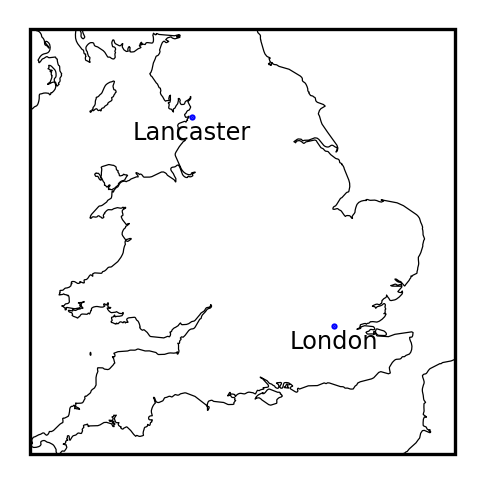

In [ ]:
fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})
da = CPM_DAS[eval_vars[0]]
ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for label, q in BOX_LOCATIONS.items():
    single_box_da = da.cf.sel(**q, method="nearest")
    ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
    ax.annotate(
        xy=(single_box_da.cf["X"].item(), single_box_da.cf["Y"].item()), xycoords="data",
        text=label, xytext=(0, -15), textcoords="offset pixels",
        ha='center',va="center", transform=cp_model_rotated_pole, fontsize="xx-small")
    
plt.show()

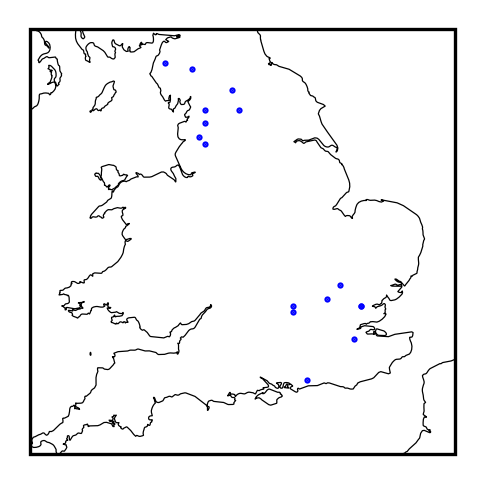

In [ ]:
da = CPM_DAS[eval_vars[0]]

rng = np.random.default_rng(42)

RANDOM_BOX_LOCATIONS = {
    srname: {
        i: { c: rng.choice(da.isel(**SUBREGIONS[srname]).cf[c], 1)[0] for c in ["X", "Y"] }
        for i in range(8) }
    for srname in SUBREGIONS.keys()
}

fig = plt.figure(layout="constrained", figsize=(1.5, 1.5))
ax = fig.subplots(subplot_kw={"projection": cp_model_rotated_pole})
ax.coastlines(**{"resolution": "10m", "linewidth": 0.3})

ax.set_extent((
    da.cf["X"].min(),
    da.cf["X"].max(),
    da.cf["Y"].min(),
    da.cf["Y"].max(),
))

for srname, sr_random_box_locations in RANDOM_BOX_LOCATIONS.items():
    for q in sr_random_box_locations.values():
        single_box_da = da.cf.sel(**q, method="nearest")
        ax.plot(single_box_da.cf["X"].values, single_box_da.cf["Y"].values, color='blue', markersize=0.5, marker='o', transform=cp_model_rotated_pole)
        
plt.show()

### Figure: single box distribution

* Frequency Density Histogram of rainfall intensities

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

#### pr

NaN Count 
 RMS Mean Bias (mm/day) 
 RMS Std Dev Bias (mm/day) 
 RMS Q999 Bias (mm/day) 
 Relative RMS Mean Bias (%) 
 Relative RMS Std Dev Bias (%) 
 Relative RMS Q999 Bias (%) 
 J-S distance 
 Emu > 0.1 
 Emu > 0.1 - CPM > 0.1 
 Emu > 25 
 Emu > 25 - CPM > 25 
 Emu > 75 
 Emu > 75 - CPM > 75 
 Emu > 125 
 Emu > 125 - CPM > 125 
 grid_latitude 
 grid_longitude 
 quantile 
 
 
 location 
 model 
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 London 
 BCSD_cCPM 
 0 
 0.02012 
 0.4103 
 2.398 
 1.107 
 9.835 
 6.221 
 0.03324 
 0.5517 
 0.1098 
 0.003279 
 -0.001119 
 0 
 -3.858e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.03034 
 0.178 
 2.785 
 1.669 
 4.267 
 7.225 
 0.01697 
 0.4561 
 0.01418 
 0.004077 
 -0.0003215 
 1.286e-05 
 -2.572e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.05898 
 0.08408 
 0.1481 
 3.243 
 2.015 
 0.3842 
 0.01556 
 0.4348 
 -0.007112 
 0.004482 
 8.359e-05 
 1.286e-05 
 -2.572e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1866 
 0.6113 
 7.968 
 10.26 
 14.65 
 20.67 
 0.02929 
 0.4785 
 0.03657 
 0.002431 
 -0.001968 
 0 
 -3.858e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.01087 
 0.6122 
 4.313 
 0.2931 
 9.525 
 8.608 
 0.046 
 0.752 
 0.1523 
 0.01227 
 -0.004745 
 7.716e-05 
 -3.858e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.06295 
 0.2637 
 1.533 
 1.697 
 4.103 
 3.06 
 0.01925 
 0.6226 
 0.02282 
 0.01467 
 -0.002341 
 9.645e-05 
 -1.929e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.00289 
 0.009481 
 0.2879 
 0.07791 
 0.1475 
 0.5747 
 0.01385 
 0.6008 
 0.001055 
 0.01679 
 -0.0002251 
 9.645e-05 
 -1.929e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.0838 
 0.4389 
 5.712 
 2.259 
 6.829 
 11.4 
 0.02706 
 0.6466 
 0.04684 
 0.01416 
 -0.002855 
 7.716e-05 
 -3.858e-05 
 0 
 0 
 1.51 
 359.8 
 0.999

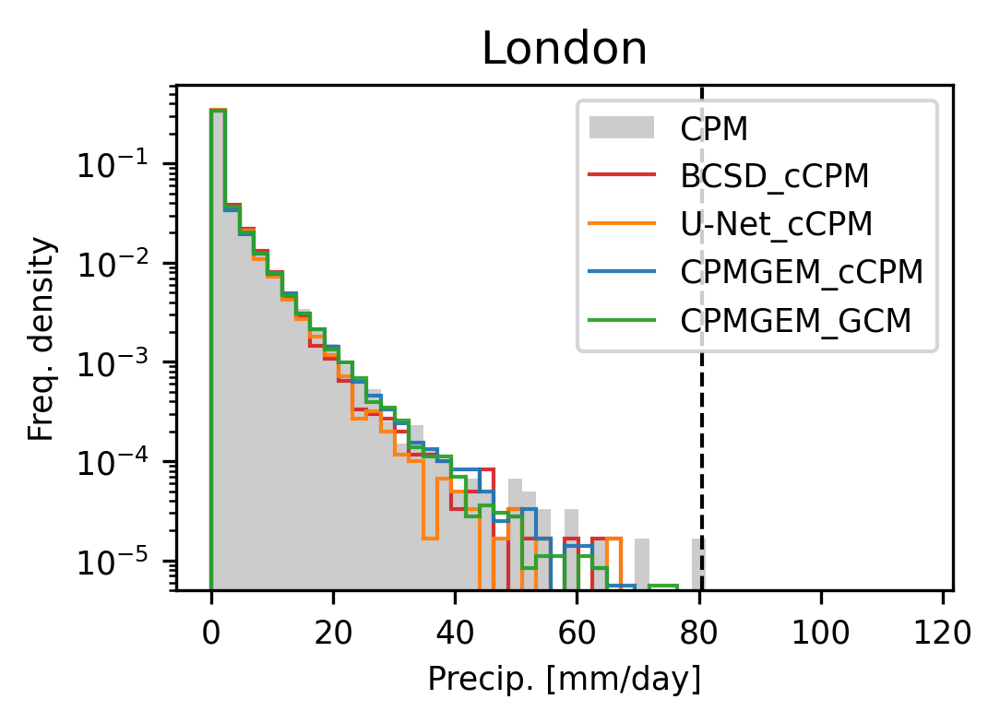

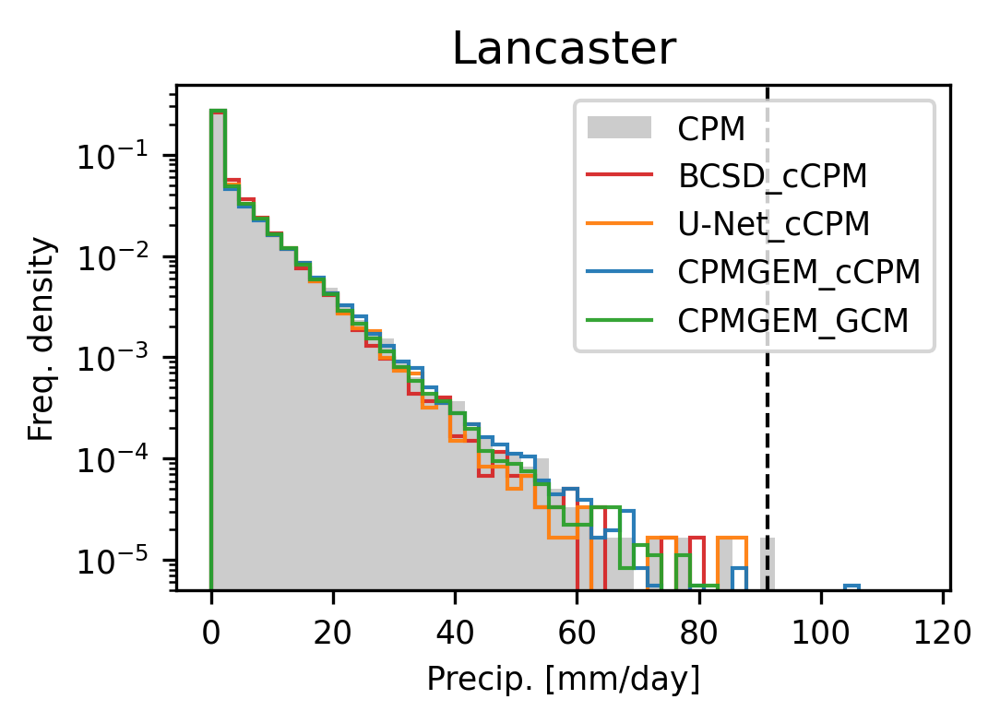

In [ ]:
def _metrics(label, q, var_ds, thresholds):
    ds = var_ds.cf.sel(**q, method="nearest")
    cpm_da = ds[f"target_{var}"]
    pred_da = ds[f"pred_{var}"]
    
    return compute_metrics(pred_da, cpm_da, thresholds=thresholds).expand_dims({"location": [label]})
    
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
        
    metrics_ds = xr.concat(
        [ _metrics(label, q, VAR_DAS[var], DIST_THRESHOLDS[var]) for label, q in BOX_LOCATIONS.items() ], 
        dim="location"
    )

    pretty_table(metrics_ds, round=4)
    
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        pred_da = ds[f"pred_{var}"]
        cpm_da = ds[f"target_{var}"]
        
        fig = plt.figure(layout="constrained", figsize=(3.5, 2.5))
        
        ax = plot_freq_density_figure(pred_da, cpm_da, MODELLABEL2SPEC, fig)
        
        ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
        ax.set_title(label)
        
        plt.show()

### London vs SE (inc SE domain max) distribution

#### pr

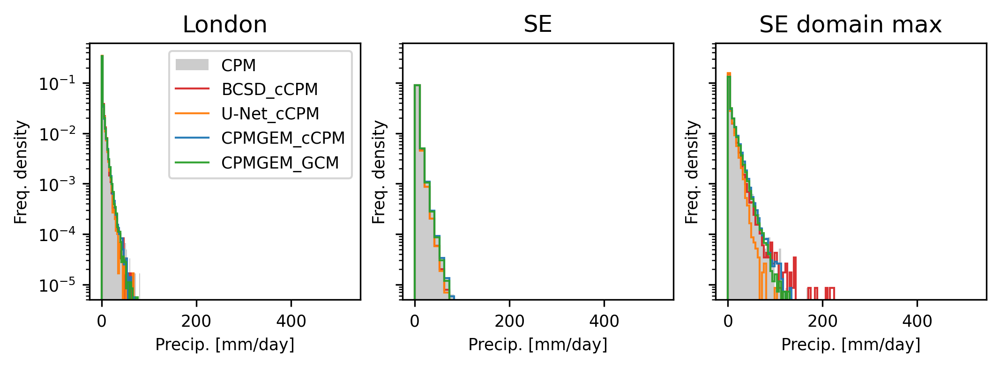

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    axd = fig.subplot_mosaic([["London", "SE", "SE max"]], sharex=True, sharey=True)

    
    label="London"
    q = BOX_LOCATIONS[label]
    
    ds = VAR_DAS[var].cf.sel(**q, method="nearest")
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[label]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log")
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(label)

    label="SE"
    q = SUBREGIONS[label]
    
    ds = VAR_DAS[var]
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[label]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log", legend=False)
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(label)
    
    label="SE"
    q = SUBREGIONS[label]
    
    ds = VAR_DAS[var].isel(**q).max(["grid_longitude", "grid_latitude"], keep_attrs=True)
    
    pred_da = ds[f"pred_{var}"]
    cpm_da = ds[f"target_{var}"]
    
    hist_data = sorted(
        map(
            lambda modelgp: dict(
                data=modelgp[1].squeeze("model"),
                label=modelgp[0],
                color=MODELLABEL2SPEC[modelgp[0]]["color"],
            ),
            pred_da.groupby("model", squeeze=False),
        ),
        key=lambda x: MODELLABEL2SPEC[x["label"]]["order"],
    )

    ax = axd[f"{label} max"]
    plot_freq_density(hist_data, ax=ax, target_da=cpm_da, linewidth=1, yscale="log", legend=False)
    
    # ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
    ax.set_title(f"{label} domain max")
        
    plt.show()

### pr

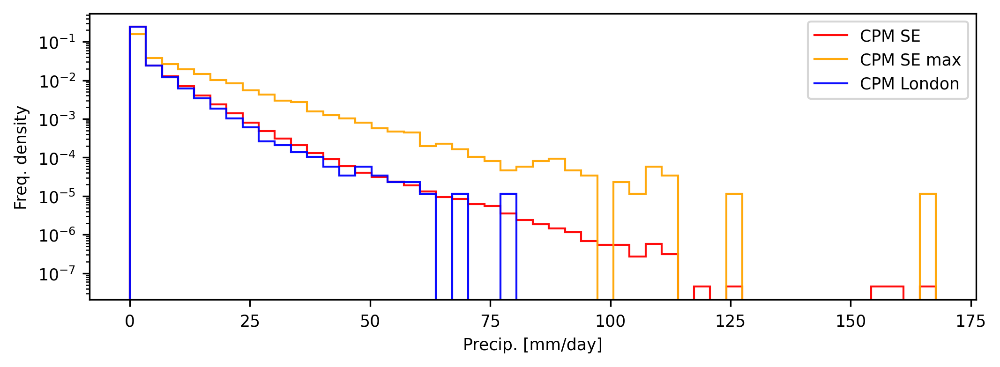

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    ax = fig.subplots()
    
    hist_data = [
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["SE"]),
            label="CPM SE",
            color="red",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["SE"]).max(["grid_longitude", "grid_latitude"]),
            label="CPM SE max",
            color="orange",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].cf.sel(**BOX_LOCATIONS["London"], method="nearest"),
            label="CPM London",
            color="blue",
        ),
    ]

    plot_freq_density(hist_data, ax=ax, linewidth=1, yscale="log")
       
    plt.show()

### pr

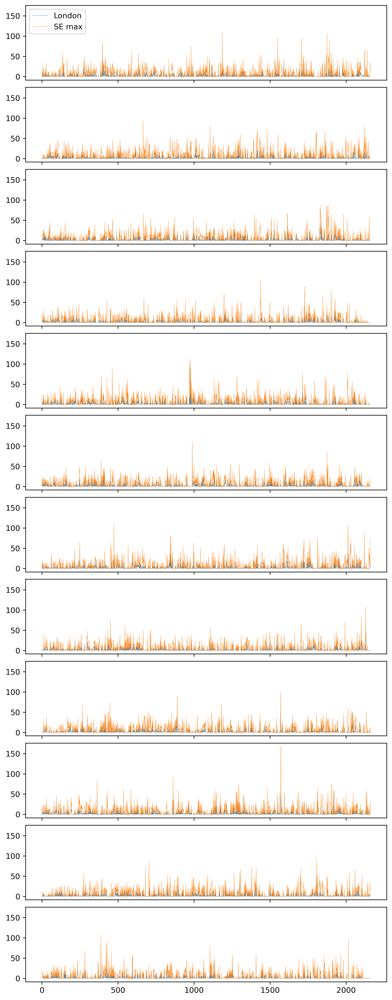

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 1.5*len(ensemble_members)))

    axd = fig.subplot_mosaic(np.array(ensemble_members).reshape(-1,1), sharex=True, sharey=True)

    for i, em in enumerate(ensemble_members):
        da = VAR_DAS[var][f"target_{var}"].sel(ensemble_member=em)
        ax = axd[em]
        ax.plot(range(len(da["time"])), da.cf.sel(**BOX_LOCATIONS["London"], method="nearest"), linewidth=0.3, label="London")
        ax.plot(range(len(da["time"])), da.isel(**SUBREGIONS["SE"]).max(["grid_longitude", "grid_latitude"], keep_attrs=True), linewidth=0.3, label="SE max")
        if i == 0:
            ax.legend()


    plt.show()

### Lancaster vs NW (inc NW domain max) distribution

### pr

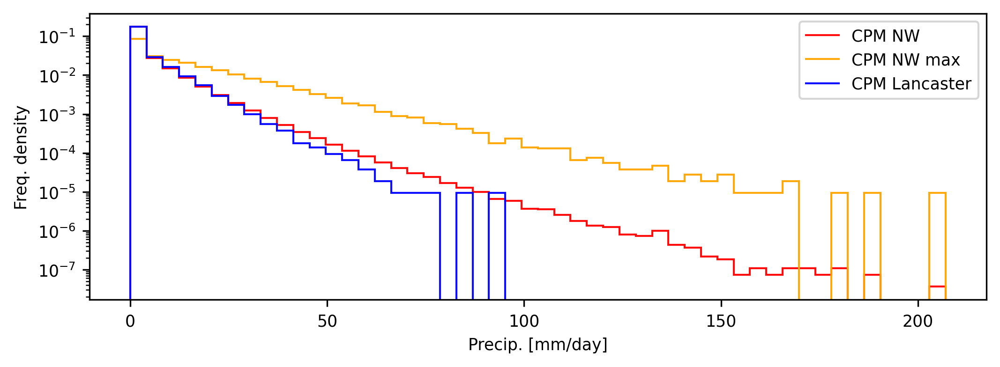

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 2.5))

    ax = fig.subplots()
    
    hist_data = [
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["NW"]),
            label="CPM NW",
            color="red",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].isel(**SUBREGIONS["NW"]).max(["grid_longitude", "grid_latitude"]),
            label="CPM NW max",
            color="orange",
        ),
        dict(
            data=VAR_DAS[var][f"target_{var}"].cf.sel(**BOX_LOCATIONS["Lancaster"], method="nearest"),
            label="CPM Lancaster",
            color="blue",
        ),
    ]

    plot_freq_density(hist_data, ax=ax, linewidth=1, yscale="log")
       
    plt.show()

### pr

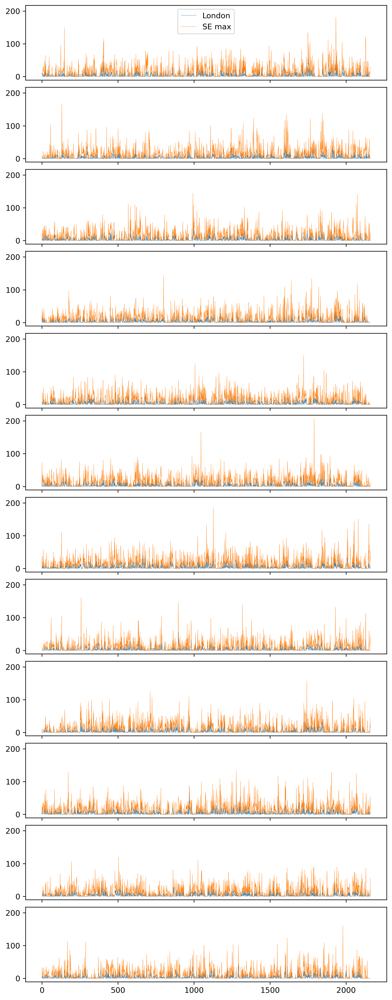

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"### {var}", raw=True)

    fig = plt.figure(layout="constrained", figsize=(7, 1.5*len(ensemble_members)))

    axd = fig.subplot_mosaic(np.array(ensemble_members).reshape(-1,1), sharex=True, sharey=True)

    for i, em in enumerate(ensemble_members):
        da = VAR_DAS[var][f"target_{var}"].sel(ensemble_member=em)
        ax = axd[em]
        ax.plot(range(len(da["time"])), da.cf.sel(**BOX_LOCATIONS["Lancaster"], method="nearest"), linewidth=0.3, label="London")
        ax.plot(range(len(da["time"])), da.isel(**SUBREGIONS["NW"]).max(["grid_longitude", "grid_latitude"], keep_attrs=True), linewidth=0.3, label="SE max")
        if i == 0:
            ax.legend()


    plt.show()

### Figure: per time period single box distribution

* Frequency Density Histogram of rainfall intensities

Table of:

* RMS biases
* J-S Distances
* proportion of density over thresholds

#### pr

NaN Count 
 RMS Mean Bias (mm/day) 
 RMS Std Dev Bias (mm/day) 
 RMS Q999 Bias (mm/day) 
 Relative RMS Mean Bias (%) 
 Relative RMS Std Dev Bias (%) 
 Relative RMS Q999 Bias (%) 
 J-S distance 
 Emu > 0.1 
 Emu > 0.1 - CPM > 0.1 
 Emu > 25 
 Emu > 25 - CPM > 25 
 Emu > 75 
 Emu > 75 - CPM > 75 
 Emu > 125 
 Emu > 125 - CPM > 125 
 grid_latitude 
 grid_longitude 
 quantile 
 
 
 time_period 
 location 
 model 
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
   
 
 
 
 
 future 
 London 
 BCSD_cCPM 
 0 
 0.007748 
 0.3256 
 0.7346 
 0.4298 
 7.446 
 1.882 
 0.03931 
 0.5021 
 0.09641 
 0.005556 
 -0.0005787 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.1084 
 0.2629 
 0.173 
 6.011 
 6.013 
 0.4432 
 0.03209 
 0.4112 
 0.005575 
 0.004958 
 -0.001177 
 3.858e-05 
 3.858e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.06545 
 0.08218 
 2.424 
 3.631 
 1.879 
 6.208 
 0.02902 
 0.3971 
 -0.008603 
 0.00544 
 -0.0006944 
 3.858e-05 
 3.858e-05 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1805 
 0.7745 
 6.341 
 10.02 
 17.71 
 16.24 
 0.05093 
 0.4747 
 0.06898 
 0.002315 
 -0.003819 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.001344 
 0.5622 
 4.595 
 0.03505 
 8.276 
 8.865 
 0.05334 
 0.7346 
 0.1513 
 0.01539 
 -0.005208 
 0.0001157 
 0 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.03334 
 0.1712 
 1.828 
 0.8693 
 2.52 
 3.527 
 0.0287 
 0.606 
 0.02269 
 0.01834 
 -0.002257 
 0.0001157 
 0 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.003678 
 0.0393 
 0.5184 
 0.09588 
 0.5786 
 1 
 0.02844 
 0.5833 
 -3.858e-05 
 0.02064 
 3.858e-05 
 0.000135 
 1.929e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1622 
 0.7743 
 7.995 
 4.23 
 11.4 
 15.43 
 0.04601 
 0.6515 
 0.06817 
 0.01505 
 -0.005556 
 0 
 -0.0001157 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 historic 
 London 
 BCSD_cCPM 
 0 
 0.04072 
 0.5605 
 8.479 
 2.175 
 13.88 
 21.47 
 0.04303 
 0.6002 
 0.1194 
 0.00162 
 -0.001389 
 0 
 -0.0001157 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.03623 
 0.1247 
 7.63 
 1.935 
 3.088 
 19.33 
 0.02891 
 0.5028 
 0.02205 
 0.003337 
 0.0003279 
 0 
 -0.0001157 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.0582 
 0.1292 
 5.112 
 3.108 
 3.199 
 12.95 
 0.02971 
 0.4756 
 -0.005189 
 0.003472 
 0.000463 
 0 
 -0.0001157 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.195 
 0.5279 
 8.961 
 10.41 
 13.08 
 22.69 
 0.03592 
 0.4895 
 0.008681 
 0.002199 
 -0.0008102 
 0 
 -0.0001157 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 Lancaster 
 BCSD_cCPM 
 0 
 0.02674 
 0.6572 
 4.7 
 0.7642 
 11.18 
 10.77 
 0.06798 
 0.7645 
 0.156 
 0.008565 
 -0.003935 
 0 
 0 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.005322 
 0.1385 
 0.4323 
 0.1521 
 2.357 
 0.9909 
 0.02887 
 0.6366 
 0.02811 
 0.01175 
 -0.0007523 
 5.787e-05 
 5.787e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.043 
 0.1097 
 2.945 
 1.229 
 1.867 
 6.749 
 0.02648 
 0.6137 
 0.005247 
 0.01294 
 0.0004437 
 7.716e-05 
 7.716e-05 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.07277 
 0.03442 
 3.573 
 2.08 
 0.5857 
 8.19 
 0.0389 
 0.6429 
 0.03449 
 0.01273 
 0.0002315 
 0.0001157 
 0.0001157 
 0 
 0 
 1.51 
 359.8 
 0.999 
 
 
 present 
 London 
 BCSD_cCPM 
 0 
 0.0119 
 0.3586 
 0.8435 
 0.6683 
 8.751 
 2.257 
 0.04527 
 0.5528 
 0.1135 
 0.002662 
 -0.001389 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_GCM 
 0 
 0.0189 
 0.1439 
 2.452 
 1.062 
 3.512 
 6.561 
 0.02758 
 0.4541 
 0.01491 
 0.003935 
 -0.0001157 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 CPMGEM_cCPM 
 0 
 0.05328 
 0.04234 
 0.1463 
 2.993 
 1.033 
 0.3914 
 0.02688 
 0.4317 
 -0.007542 
 0.004533 
 0.0004823 
 0 
 0 
 0 
 0 
 -0.9699 
 361.5 
 0.999 
 
 
 U-Net_cCPM 
 0 
 0.1843 
 0.5243 
 6.331 
 10.35 
 12.8 
 16.94 
 0.03971 
 0.4713 
 0.03206 
 0.002778 
 -0.001273 
 0 
 0 
 0 
 0 

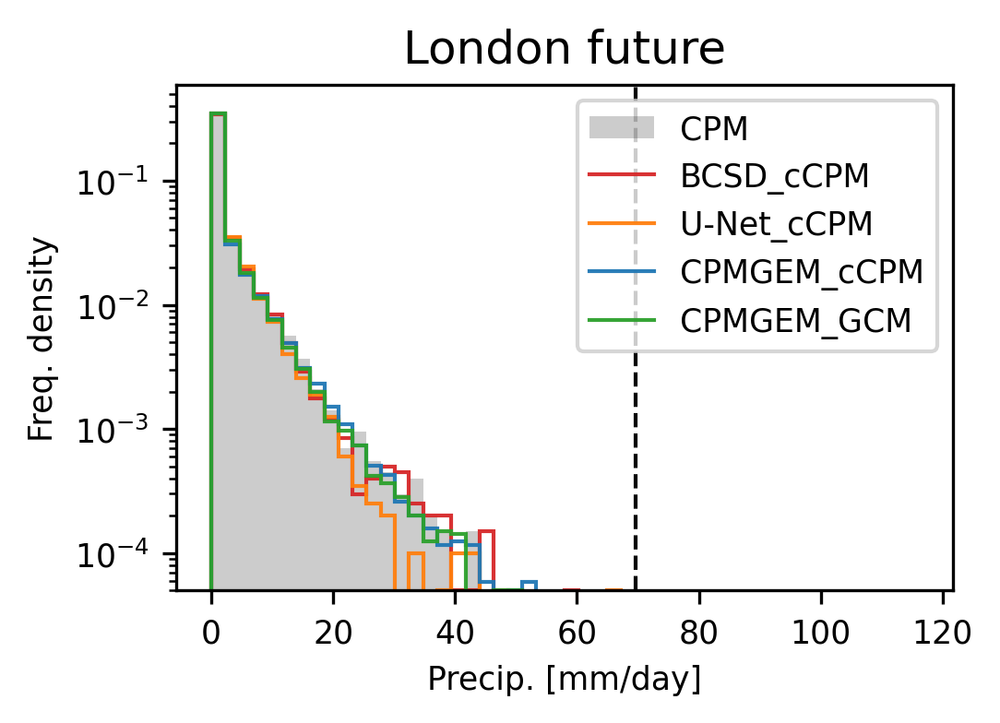

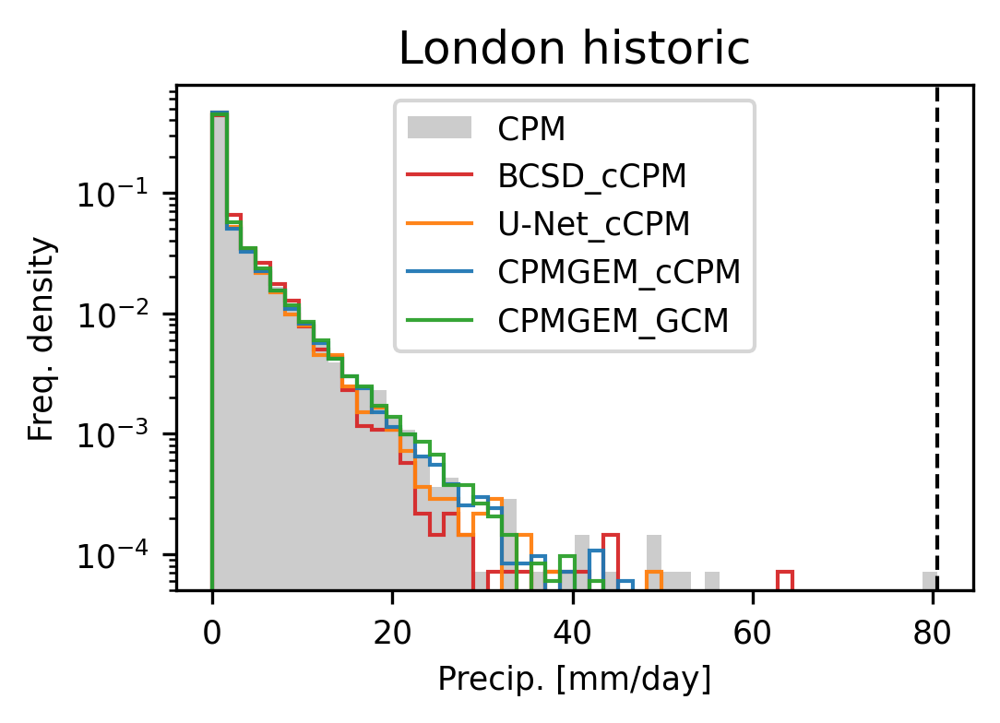

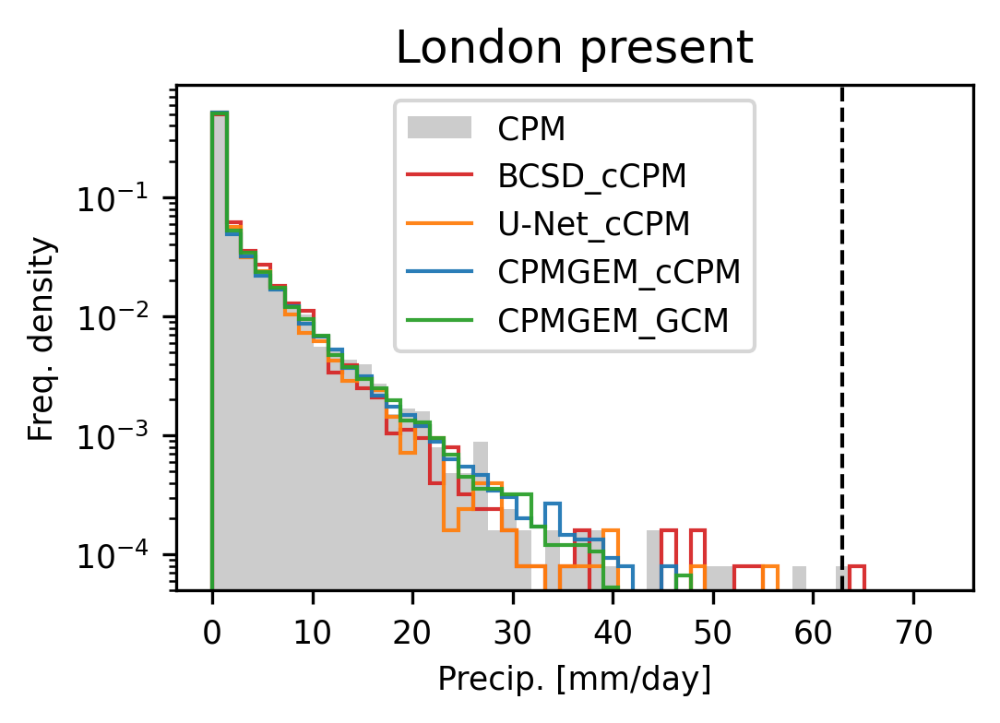

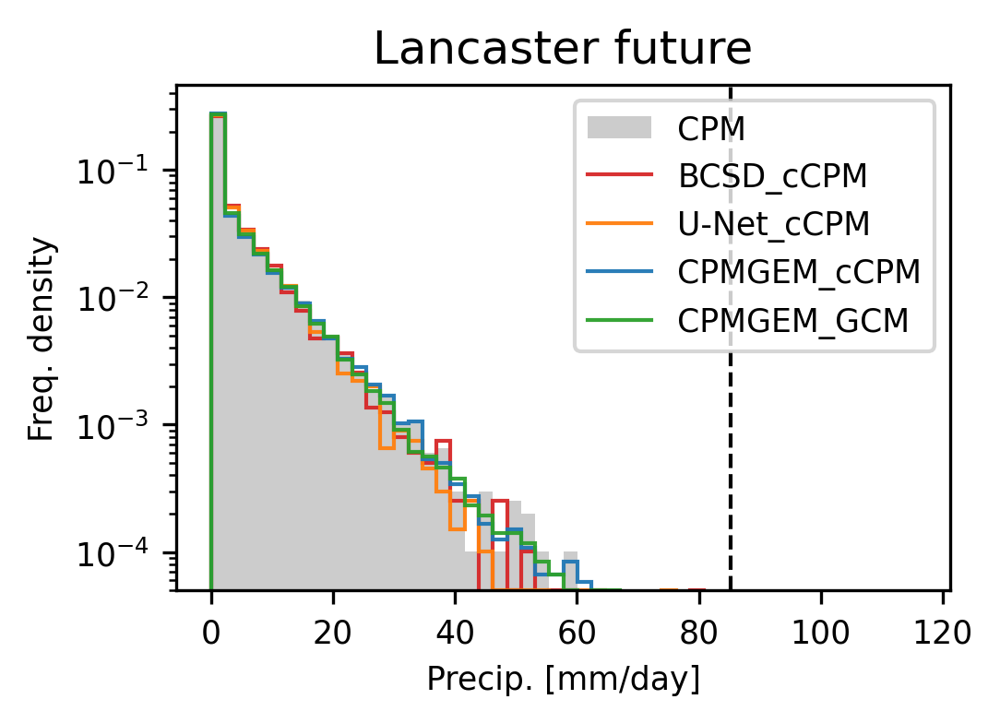

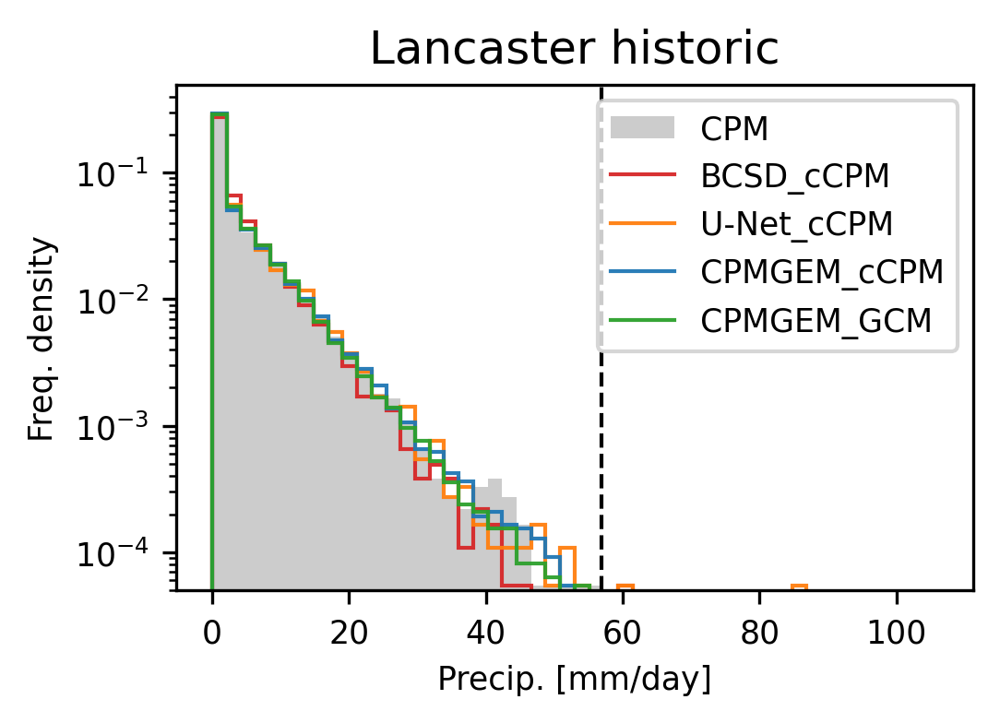

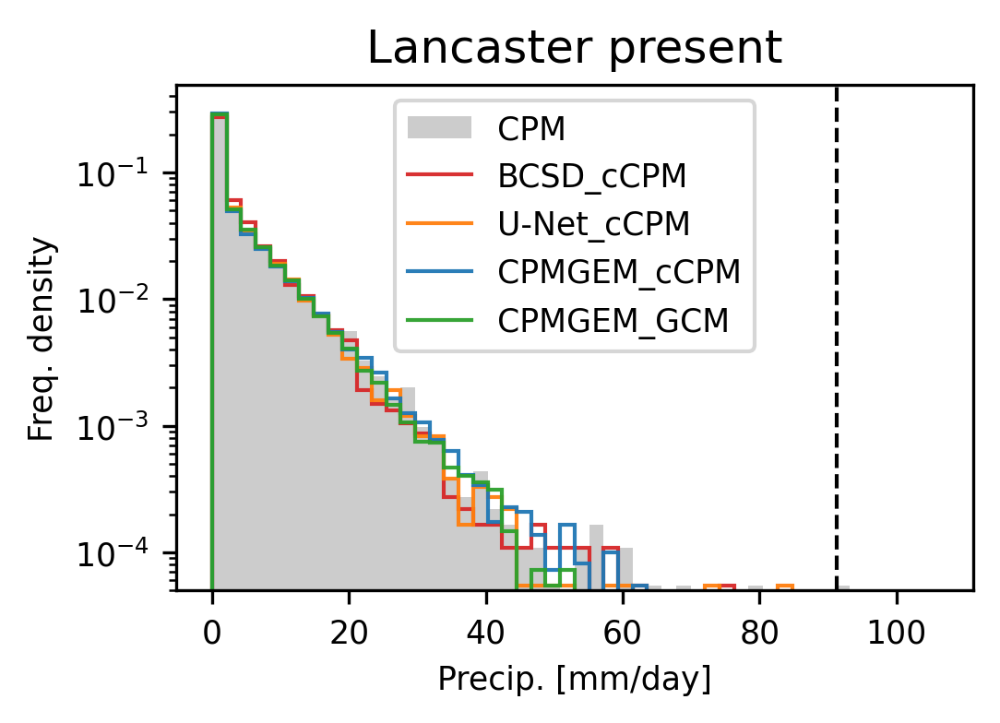

In [ ]:
for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
    
    metrics_ds = xr.concat([
            xr.concat([ _metrics(label, q, tp_ds, DIST_THRESHOLDS[var]) for label, q in BOX_LOCATIONS.items() ], dim="location").expand_dims({"time_period": [tp]})
         for tp, tp_ds in VAR_DAS[var].groupby("time_period") ], 
        dim="time_period"
    )

    pretty_table(metrics_ds, round=4)
    
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        for tp, tp_ds in ds.groupby("time_period"):
            pred_da = tp_ds[f"pred_{var}"]
            cpm_da = tp_ds[f"target_{var}"]
    
            fig = plt.figure(layout="constrained", figsize=(3.5, 2.5))
            ax = plot_freq_density_figure(pred_da, cpm_da, MODELLABEL2SPEC, fig)
            ax.axvline(x=cpm_da.max(), color='k', linestyle='--', linewidth=1)
            ax.set_title(f"{label} {tp}")
            
            plt.show()

### Individual QQ plots

#### pr

-4


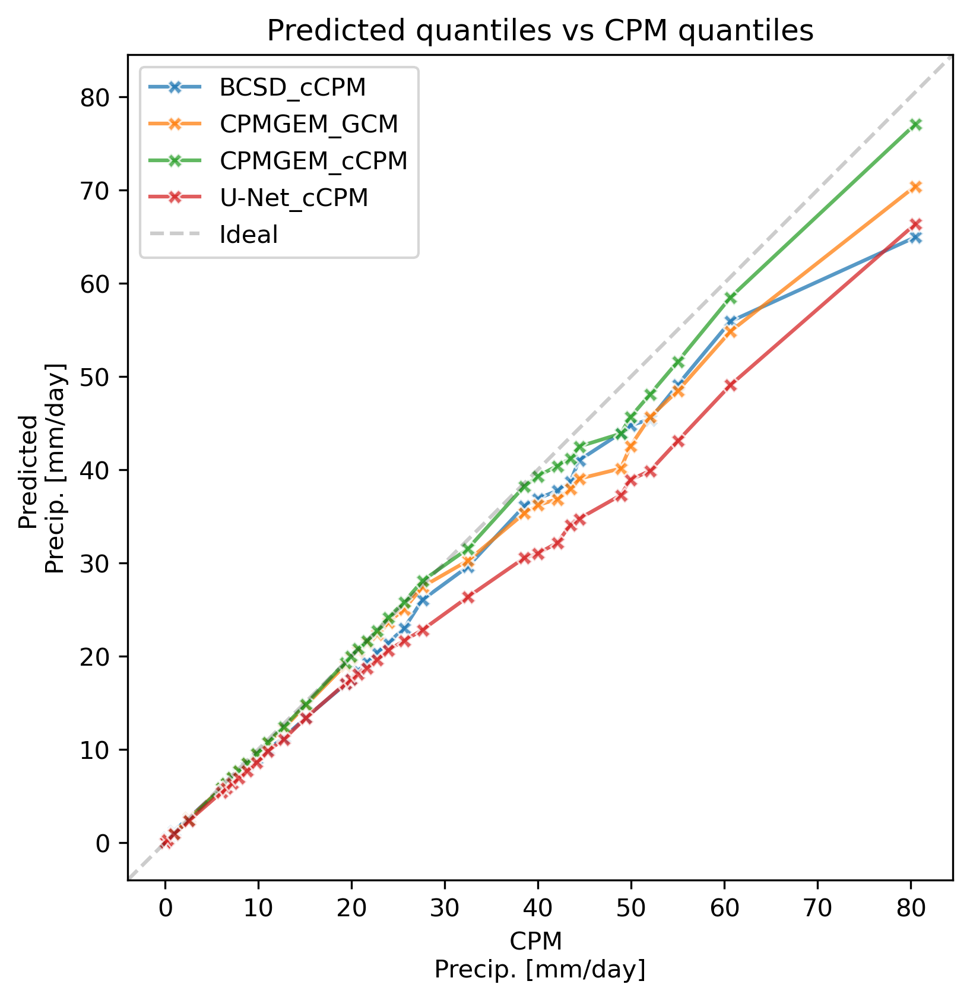

-4


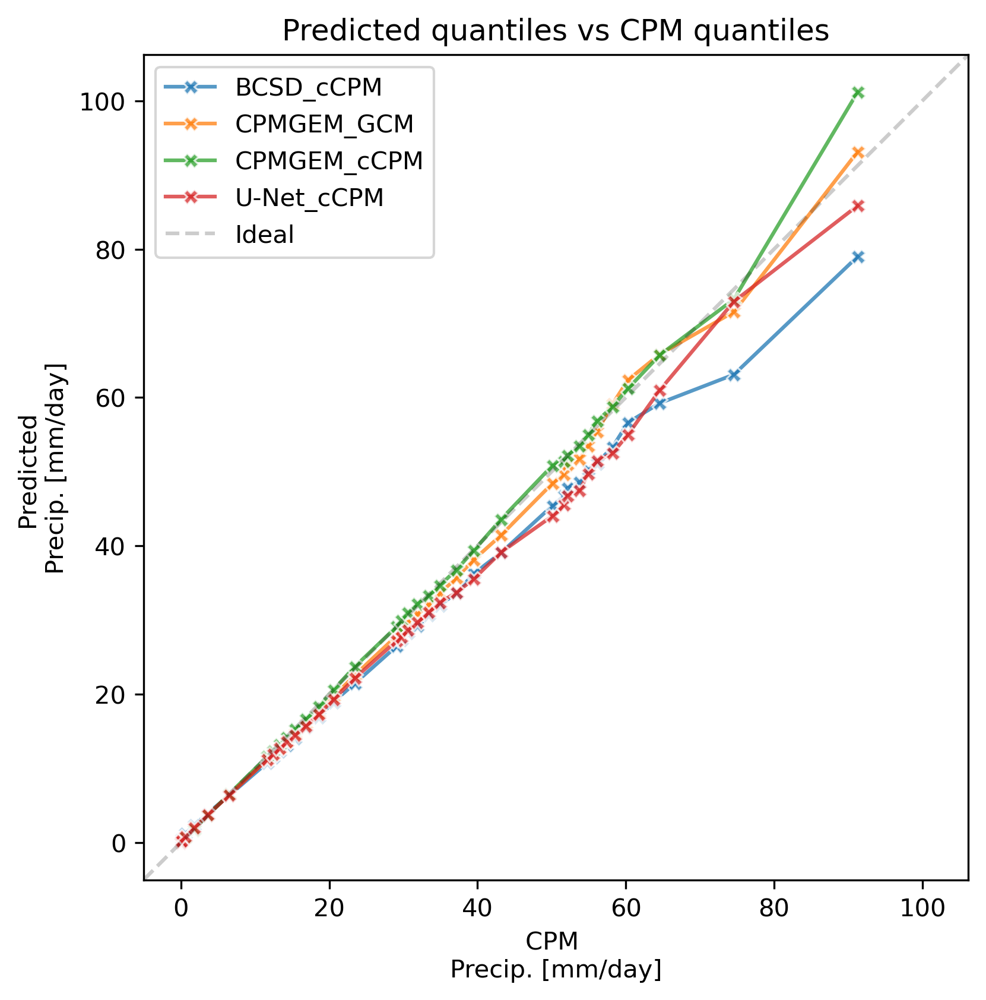

In [ ]:
quantile_dims=["ensemble_member", "time"]

for var in eval_vars:
    IPython.display.display_markdown(f"#### {var}", raw=True)
    for label, q in BOX_LOCATIONS.items():
        ds = VAR_DAS[var].cf.sel(**q, method="nearest")
        pred_da = ds[f"pred_{var}"]
        cpm_da = ds[f"target_{var}"]
        
        quantiles = reasonable_quantiles(cpm_da)
        cpm_quantiles = cpm_da.quantile(quantiles, dim=quantile_dims).rename("target_q")
    
        pred_quantiles = pred_da.quantile(quantiles, dim=quantile_dims).rename("pred_q")

        layout="constrained"

        fig, ax = plt.subplots(figsize=(5.5, 5.5), layout="constrained")

        xlabel = f"CPM \n{xr.plot.utils.label_from_attrs(da=cpm_da)}"
        ylabel = f"Predicted \n{xr.plot.utils.label_from_attrs(da=pred_da)}"

        qq_plot(ax, cpm_quantiles, pred_quantiles, title=f"Predicted quantiles vs CPM quantiles", xlabel=xlabel, ylabel=ylabel)

        plt.show()

## Figure: Threshold exceedence

Threshold: 0.1mm/day 
 
 
   
   
 % Threshold exceeded 
 
 
 season 
 model 
   
 
 
 
 
 Annual 
 BCSD_cCPM 
 66.3 
 
 
 CPMGEM_GCM 
 55.1 
 
 
 CPMGEM_cCPM 
 52.9 
 
 
 U-Net_cCPM 
 56.8 
 
 
 CPM 
 53.4 
 
 
 DJF 
 BCSD_cCPM 
 79.1 
 
 
 CPMGEM_GCM 
 68.5 
 
 
 CPMGEM_cCPM 
 66.7 
 
 
 U-Net_cCPM 
 68.6 
 
 
 CPM 
 67.9 
 
 
 MAM 
 BCSD_cCPM 
 68.3 
 
 
 CPMGEM_GCM 
 59.5 
 
 
 CPMGEM_cCPM 
 56.9 
 
 
 U-Net_cCPM 
 58.8 
 
 
 CPM 
 56.3 
 
 
 JJA 
 BCSD_cCPM 
 51.7 
 
 
 CPMGEM_GCM 
 38.4 
 
 
 CPMGEM_cCPM 
 37.1 
 
 
 U-Net_cCPM 
 45.9 
 
 
 CPM 
 37.1 
 
 
 SON 
 BCSD_cCPM 
 66.2 
 
 
 CPMGEM_GCM 
 53.9 
 
 
 CPMGEM_cCPM 
 51.1 
 
 
 U-Net_cCPM 
 54.0 
 
 
 CPM 
 52.3

#### Threshold: 0.1mm/day

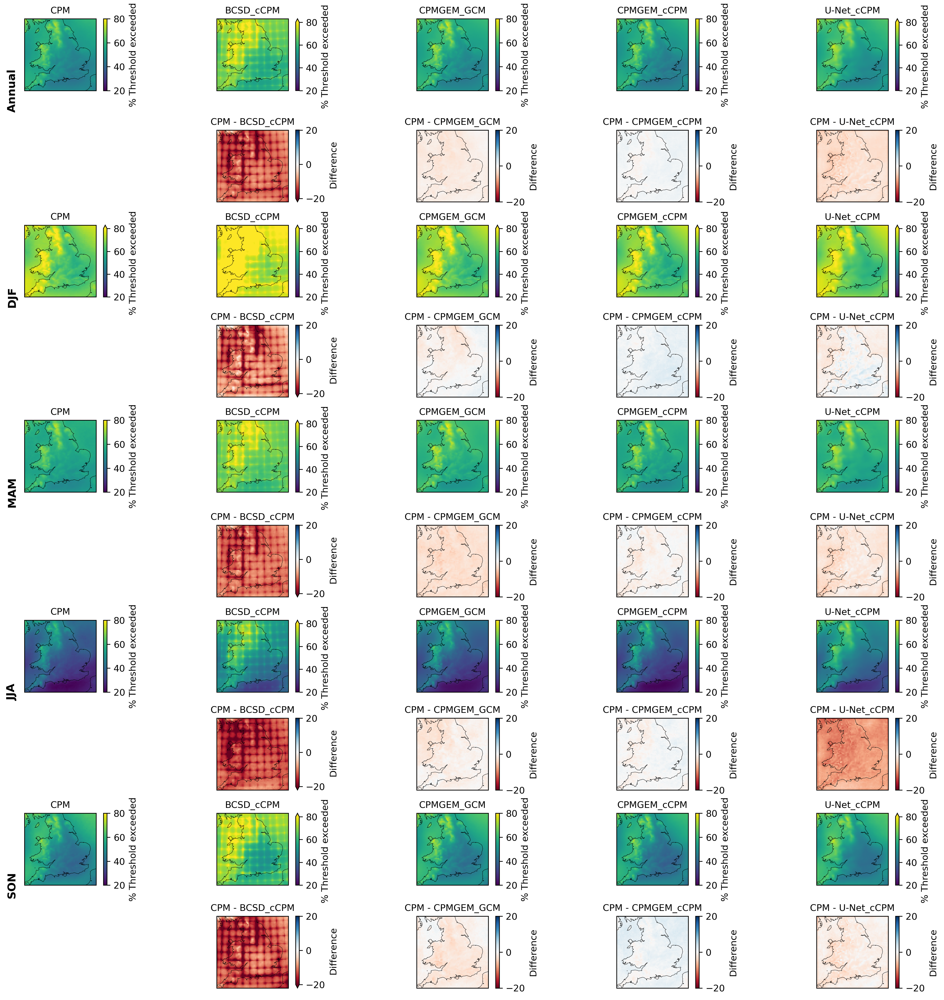

In [ ]:
for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        model_das = [
            EVAL_DS[source][f"pred_{var}"].sel(model=model)
            for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
        ]

        threshold_exceeded_stats = { threshold: threshold_exceeded_prop_stats(VAR_DAS[var][f"pred_{var}"], CPM_DAS[var], threshold) for threshold in thresholds }

        dfs = [threshold_exceeded_stats[threshold].mean(dim=["grid_latitude", "grid_longitude"]).to_dataframe().style.set_table_attributes("style='display:inline'").set_caption(f"Threshold: {threshold}{CPM_DAS[var].attrs['units']}").format(precision=1).to_html() for threshold in thresholds]

        IPython.display.display_html(functools.reduce(lambda v, e: v+e, dfs), raw=True)

        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}{CPM_DAS[var].attrs['units']}", raw=True)

            plot_threshold_exceedence_errors(threshold_exceeded_stats[threshold])

            plt.show()

## Rough: wet-day mean

#### Threshold: 0.1mm/day

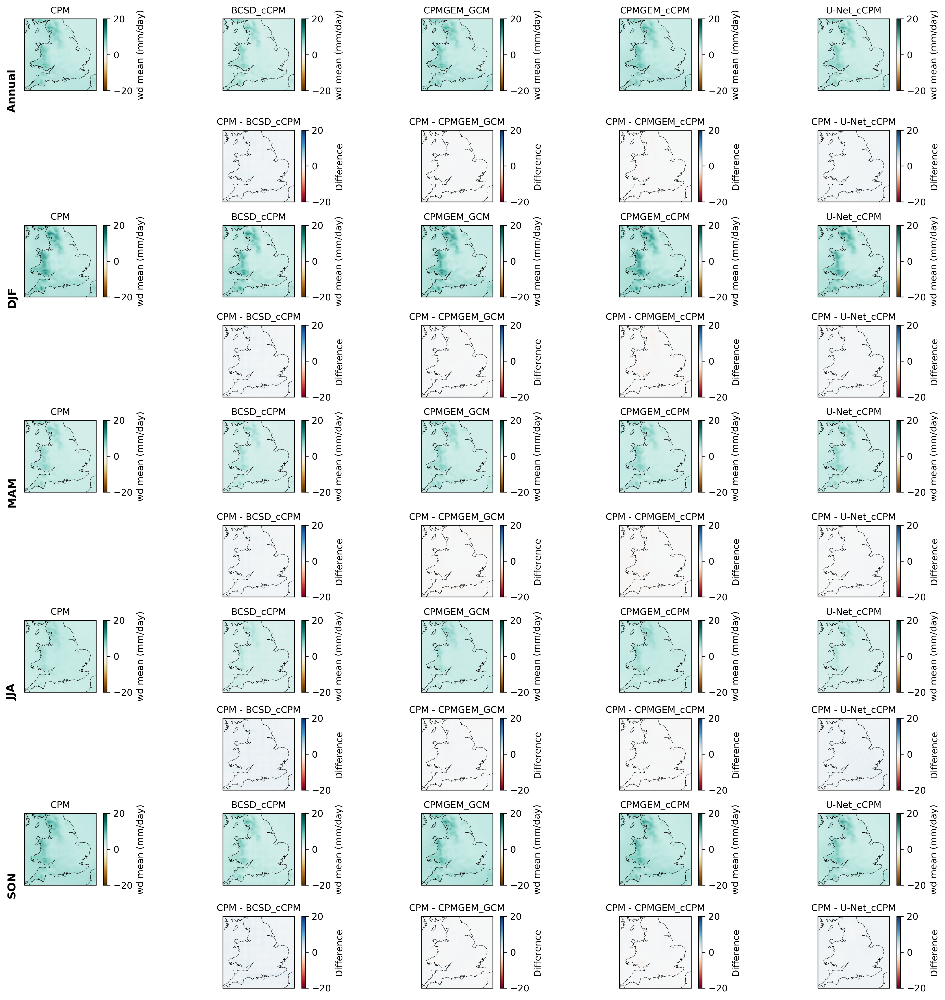

In [ ]:
model_das = [
    EVAL_DS[source]["pred_pr"].sel(model=model)
    for source, mconfigs in MODELS.items() for model, spec in mconfigs.items()
]

change_stats = { var: { threshold: threshold_exceeded_prop_stats(VAR_DAS[var][f"pred_{var}"], CPM_DAS[var], threshold=threshold, threshold_exceeded_prop_statistic=wd_mean) for threshold in thresholds } for var, thresholds in THRESHOLDS.items() if var in eval_vars }

for var, thresholds in THRESHOLDS.items():
    if var in eval_vars:
        for threshold in thresholds:
            IPython.display.display_markdown(f"#### Threshold: {threshold}mm/day", raw=True)
            
            plot_threshold_exceedence_errors(change_stats[var][threshold], style="change")
        
            plt.show()